# DreamBooth

The technique consists of finetuning the SD model with several photos with a specific prompt. 

In [1]:
import torch

if torch.cuda.is_available():
    device = "cuda"
else:
    device = "cpu"
print(device)

cuda


In [ ]:
import torch.nn as nn
import torch.nn.functional as F


import torch, glob, math, datasets
from torchvision import transforms
from accelerate import Accelerator
from accelerate.utils import set_seed
from tqdm import tqdm_notebook as tqdm
from torch.utils.data import Dataset, DataLoader
from diffusers.utils import load_image, make_image_grid
from transformers import CLIPTokenizer, CLIPTextModel, CLIPImageProcessor
from diffusers.pipelines.stable_diffusion import StableDiffusionSafetyChecker
from diffusers import AutoencoderKL, UNet2DConditionModel, DDPMScheduler, PNDMScheduler, StableDiffusionPipeline


2024-11-22 16:14:38.569501: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-22 16:14:38.569566: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-22 16:14:38.571992: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-22 16:14:38.583269: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-11-22 16:14:40.214917: W tensorflow/compiler/tf2

## Load Data

In [4]:
img_dict = {"image": []}

for file in glob.glob('./tmp/iguana/*'):
    img_dict["image"].append(file)
print(img_dict)

dataset = datasets.Dataset.from_dict(img_dict).cast_column("image", datasets.Image())
dataset

{'image': ['./tmp/iguana/10-blue-iguana-facts-1703747731.jpeg', './tmp/iguana/Adopt-King-Blue.jpg', './tmp/iguana/CON-Blue-Iguana-3.jpg', './tmp/iguana/Our-Personalized-Tours-Iguana-768x576-1.jpeg', './tmp/iguana/sddefault.jpg']}


Dataset({
    features: ['image'],
    num_rows: 5
})

In [5]:
dataset

Dataset({
    features: ['image'],
    num_rows: 5
})

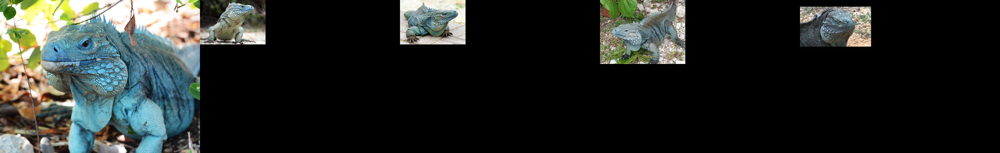

In [6]:
make_image_grid(dataset['image'], rows=1, cols=5)

## Set Prompt

In [7]:
concept = "kiguaing"
animal = "ignuana"

prompt = f"a photo of {concept} {animal}"


## Define Dataset

In [8]:
# load tokenizer

ckp = "CompVis/stable-diffusion-v1-4"

tokenizer = CLIPTokenizer.from_pretrained(ckp, subfolder="tokenizer")

In [9]:
# datset

class DBDataset(Dataset):

    def __init__(self, ds, prompt, tokenizer, size=512):
        self.dataset = ds
        self.prompt = prompt
        self.tokenizer = tokenizer
        self.size = size
        self.transforms = transforms.Compose([
            transforms.Resize(size),
            transforms.CenterCrop(size),
            transforms.ToTensor(),
            transforms.Normalize([0.5], [0.5]),
        ])

    def __len__(self):
        return len(self.dataset)
    
    def __getitem__(self, idx):
        sample = {}
        img = self.dataset[idx]["image"]
        # print("img: ", img)
        sample["image"] = self.transforms(img)
        # print("sample: ", sample["image"])
        sample["prompt"] = self.tokenizer(self.prompt, padding="do_not_pad", truncation=True, max_length=self.tokenizer.model_max_length).input_ids
        return sample


In [10]:
# dataset

train_dataset = DBDataset(dataset, prompt, tokenizer)
train_dataset[4]

{'image': tensor([[[-0.9922, -0.9922, -0.9922,  ..., -0.9922, -0.9922, -0.9922],
          [-0.9922, -0.9922, -0.9922,  ..., -0.9922, -0.9922, -0.9922],
          [-0.9922, -0.9922, -0.9922,  ..., -0.9922, -0.9922, -0.9922],
          ...,
          [-0.9922, -0.9922, -0.9922,  ..., -0.9922, -0.9922, -0.9922],
          [-0.9922, -0.9922, -0.9922,  ..., -0.9922, -0.9922, -0.9922],
          [-0.9922, -0.9922, -0.9922,  ..., -0.9922, -0.9922, -0.9922]],
 
         [[-0.9922, -0.9922, -0.9922,  ..., -0.9922, -0.9922, -0.9922],
          [-0.9922, -0.9922, -0.9922,  ..., -0.9922, -0.9922, -0.9922],
          [-0.9922, -0.9922, -0.9922,  ..., -0.9922, -0.9922, -0.9922],
          ...,
          [-0.9922, -0.9922, -0.9922,  ..., -0.9922, -0.9922, -0.9922],
          [-0.9922, -0.9922, -0.9922,  ..., -0.9922, -0.9922, -0.9922],
          [-0.9922, -0.9922, -0.9922,  ..., -0.9922, -0.9922, -0.9922]],
 
         [[-0.9922, -0.9922, -0.9922,  ..., -0.9922, -0.9922, -0.9922],
          [-0.9922,

## Define Dataloader

In [11]:
# collate function
# serve as data loader

def collate_fn(samples):

    imgs = [sample["image"] for sample in samples]
    imgs = torch.stack(imgs)
    imgs = imgs.to(memory_format=torch.contiguous_format).float()

    input_ids = [sample["prompt"] for sample in samples]
    input_ids = tokenizer.pad({"input_ids": input_ids}, padding=True, return_tensors="pt").input_ids

    return {"images": imgs, "input_ids": input_ids}


In [12]:
dataloader = DataLoader(train_dataset, batch_size=1, shuffle=True, collate_fn=collate_fn)

In [13]:
next(iter(dataloader))

{'images': tensor([[[[-0.8588, -0.8510, -0.8510,  ..., -0.7882, -0.7804, -0.7804],
           [-0.8588, -0.8510, -0.8510,  ..., -0.7961, -0.7882, -0.7804],
           [-0.8588, -0.8510, -0.8510,  ..., -0.7961, -0.7882, -0.7882],
           ...,
           [ 0.5922,  0.5922,  0.6471,  ...,  0.8980,  0.8902,  0.9059],
           [ 0.6314,  0.5608,  0.6078,  ...,  0.9294,  0.9137,  0.9216],
           [ 0.6863,  0.6471,  0.6000,  ...,  0.9529,  0.9373,  0.9451]],
 
          [[-0.8510, -0.8510, -0.8510,  ..., -0.8431, -0.8353, -0.8353],
           [-0.8510, -0.8510, -0.8510,  ..., -0.8510, -0.8431, -0.8353],
           [-0.8510, -0.8510, -0.8510,  ..., -0.8510, -0.8431, -0.8431],
           ...,
           [ 0.4431,  0.5686,  0.6000,  ...,  0.9137,  0.9059,  0.9137],
           [ 0.5059,  0.5216,  0.5373,  ...,  0.9529,  0.9373,  0.9451],
           [ 0.5686,  0.5843,  0.5216,  ...,  0.9843,  0.9608,  0.9686]],
 
          [[-0.8824, -0.8667, -0.8667,  ..., -0.9216, -0.9137, -0.9137],
   

## Load Pipeline

In [14]:
# load pipeline

clip_encoder = CLIPTextModel.from_pretrained(ckp, subfolder="text_encoder")
vae = AutoencoderKL.from_pretrained(ckp, subfolder="vae")
unet = UNet2DConditionModel.from_pretrained(ckp, subfolder="unet")
feature_extractor = CLIPImageProcessor.from_pretrained("openai/clip-vit-base-patch32")

## Define Training Loop

In [15]:
args = Namespace(
    gradient_accumulation_steps=1,
    seed = 3434554,
    dataset = train_dataset,
    batch_size = 2,
    gradient_checkpointing = True,
    max_train_steps=1000,
    learning_rate=1e-6,
    output_dir="./tmp",
    max_grad_norm = 1.0,
)

In [ ]:
# train

def train(encoder, vae, unet):

    accelerator = Accelerator(gradient_accumulation_steps=args.gradient_accumulation_steps)

    set_seed(args.seed)

    if args.gradient_checkpointing:
        unet.enable_gradient_checkpointing()

    optim = torch.optim.Adam(unet.parameters(), args.learning_rate)

    scheduler = DDPMScheduler(beta_start=0.00085,
        beta_end=0.012,
        beta_schedule="scaled_linear",
        num_train_timesteps=1000,)
    
    dataloader = DataLoader(args.dataset, batch_size=args.batch_size, shuffle=True, collate_fn=collate_fn)

    unet, optim, dataloader = accelerator.prepare(unet, optim, dataloader)

    encoder = encoder.to(accelerator.device)
    vae = vae.to(accelerator.device)

    # recalculate the steps
    num_steps_update_per_epoch = math.ceil(len(dataloader) / args.gradient_accumulation_steps)
    num_train_epochs = math.ceil(args.max_train_steps / num_steps_update_per_epoch)

    progress_bar = tqdm(range(args.max_train_steps), disable=not accelerator.is_local_main_process)

    global_steps = 0

    for e in range(num_train_epochs):

        unet.train()

        for step, batch in enumerate(dataloader):

            with accelerator.accumulate(unet):
                
                # encode image to latents
                with torch.no_grad():
                    latents = vae.encode(batch["images"]).latent_dist.sample() * 0.18215

                # sample noise
                z = torch.randn(latents.shape).to(latents.device)

                # sample time steps
                timesteps = torch.randint(0, scheduler.config.num_train_timesteps, (z.shape[0],), device=latents.device)

                # add noise
                noisy_latents = scheduler.add_noise(latents, z, timesteps)

                # encode prompt
                with torch.no_grad():
                    encoded_prompt = encoder(batch["input_ids"])[0]

                # predict noise
                preds = unet(noisy_latents, timesteps, encoder_hidden_states=encoded_prompt).sample

                loss = F.mse_loss(preds, z, reduction="none").mean([1,2,3]).mean()

                accelerator.backward(loss)
                if accelerator.sync_gradients:
                    accelerator.clip_grad_norm_(unet.parameters(), args.max_grad_norm)
                optim.step()
                optim.zero_grad()

                if accelerator.sync_gradients:
                    progress_bar.update(1)
                    global_steps += 1

                logs = {"loss": loss.detach().item()}
                progress_bar.set_postfix(**logs)

                if global_steps >= args.max_train_steps:
                    break

    if accelerator.is_main_process:
        scheduler = PNDMScheduler(
            beta_start=0.00085,
            beta_end=0.012,
            beta_schedule="scaled_linear",
            skip_prk_steps=True,
            steps_offset=1,
        )

        pipe = StableDiffusionPipeline(
            text_encoder=encoder,
            vae=vae,
            unet=accelerator.unwrap_model(unet),
            tokenizer=tokenizer,
            scheduler=scheduler,
            safety_checker=StableDiffusionSafetyChecker.from_pretrained(
                "CompVis/stable-diffusion-safety-checker"
            ),
            feature_extractor=feature_extractor,
        )

        pipe.save_pretrained(args.output_dir)



## Train

In [17]:
from accelerate import notebook_launcher
num_of_gpus = 1 
notebook_launcher(
    train, args=(clip_encoder, vae, unet), num_processes=num_of_gpus
)

Launching training on one GPU.


/tmp/ipykernel_7910/805196044.py:39: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  progress_bar = tqdm(range(args.max_train_steps), disable=not accelerator.is_local_main_process)


  0%|          | 0/1000 [00:00<?, ?it/s]

/home/Qingyi/.local/lib/python3.10/site-packages/torch/_utils.py:831: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  return self.fget.__get__(instance, owner)()


## Inference

In [ ]:
# get pipeline
pipe = StableDiffusionPipeline.from_pretrained(
    args.output_dir
).to("cuda")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

a photo of kiguaing ignuana with a hat


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

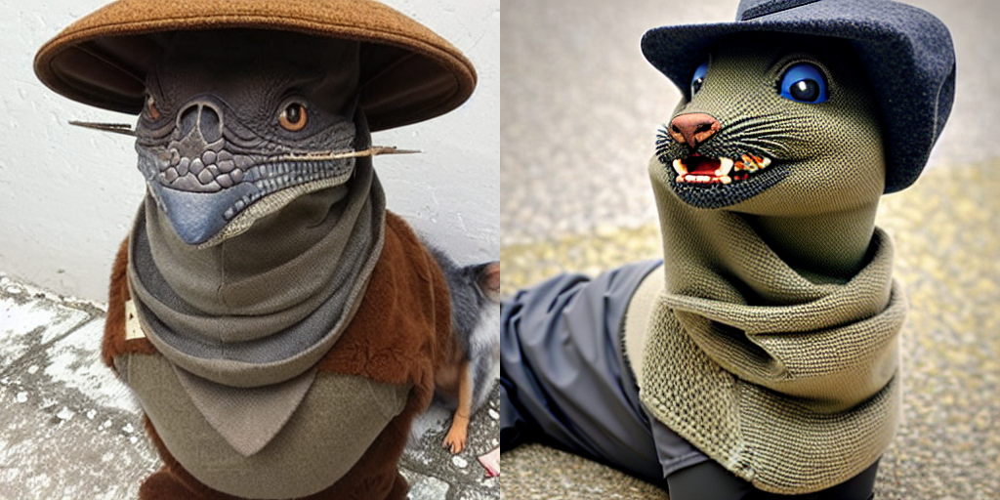

In [31]:
new_prompt = f"a photo of {concept} {animal} with a hat"
print(new_prompt)

# Tune the guidance to control how closely the generations follow the prompt
# Values between 7-11 usually work best
guidance_scale = 7.5

num_cols = 2
all_images = []
for _ in range(num_cols):
    images = pipe(new_prompt).images
    all_images.extend(images)

make_image_grid(all_images, 1, num_cols)